In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation

from animation_lib.animation_printer import PrinterResult, save_animation

In [2]:
# Загружа. результаты работы основной программы.
# Имя папки с нужной сеткой.
folder_name_mesh = "mesh_lemb_v3_nodes4141"
full_dir_mesh = "prepared_meshes/" + folder_name_mesh

# Имя папки с нужными результатами.
suffix = "_test_v9"
folder_name_res = folder_name_mesh + suffix
full_dir_res = "raw_results/" + folder_name_res

# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#           Не забыть поменять параметры
# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
all_knots = 4141
num_knot = 4
dim = 2
step = 1000

ind = [i for i in range(dim*all_knots)]  # Количество узлов * на размерность.
# ind = [i for i in range(step)]  # Количество итераций задачи.
# Смотрел раньше перемещеия, сейчас буду смотреть скорость.
# df_results = pd.read_csv(full_dir_res + '/displacments.csv', sep=",", names=ind, index_col=False)
df_results = pd.read_csv(full_dir_res + '/velocities.csv', sep=",", names=ind, index_col=False)

# Загружаю данные об элементах сетки.
col_names = ['id', 'pid'] + ['node' + str(i) for i in range(1, num_knot+1)]
df_elems = pd.read_csv(full_dir_mesh + '/elements_df.csv', names=col_names)

# Загружаю данные об узлах сетки.
col_names = ['ind', 'x', 'y']
df_nodes = pd.read_csv(full_dir_mesh + '/nodes_df.csv', names=col_names)

In [108]:
df = df_results.T

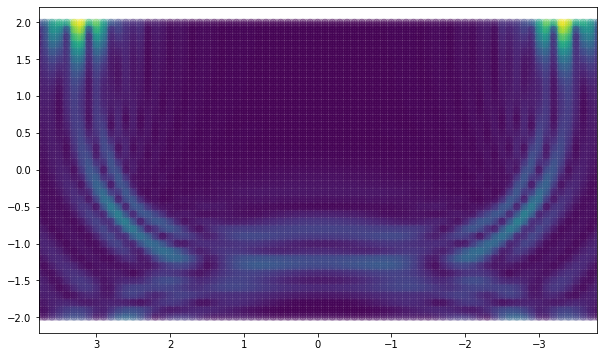

In [3]:
df = df_results.T
printer =  PrinterResult(df_elems, df_nodes, df, NUM=4)
printer.print_one(200)

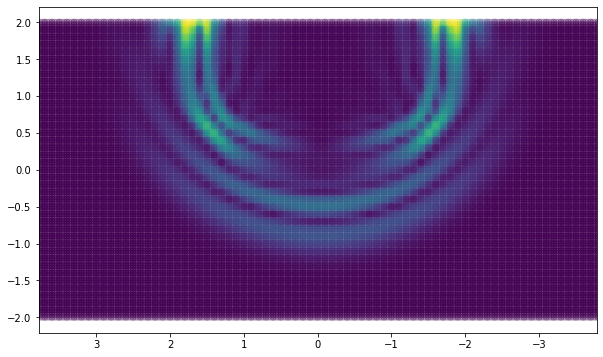

In [67]:
df = df_results.T
printer =  PrinterResult(df_elems, df_nodes, df, NUM=4)
printer.print_one(100)

In [ ]:
window = 300
x = df.iloc[2*(51 - 1)+1, :][:window].values
y = df.iloc[2*(88 - 1)+2, :][:window].values

# x = x+y
x = y

index = df.iloc[2*(27- 1), :][:window].index

plt.plot(index, -x)

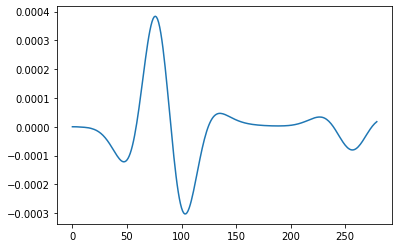

In [5]:
window = 280
# X: 2*(nid - 1)
# Y: 2*(nid - 1) + 1
# x = df.iloc[2*(1 - 1), :][:window].values
# x = df.iloc[2*(89 - 1), :][:window].values # для волны обычной
x = df.iloc[2*(73 - 1)+1, :][:window].values # для лемба

# x = x+y
# x = y

index = df.iloc[2*(27- 1), :][:window].index

plt.plot(index, -x)

Пытаюсь тут подогнать ответ путем сжатий/растяжений.

In [6]:
import segyio

with segyio.open('fidesys_results/valid_lemb_v1/valid_lemb_v1_Vy.sgy', 'rb') as file:
    for trace in file.trace:
        filtered = trace  #[np.where(trace < 1e-2)]
        
filtered[np.where(filtered == float('-inf'))] = 0

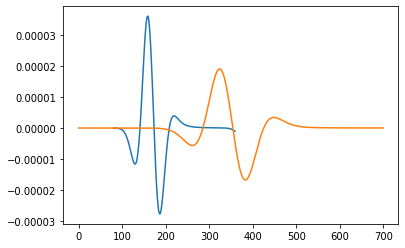

In [11]:
window = 280
# X: 2*(nid - 1)
# Y: 2*(nid - 1) + 1
# x = df.iloc[2*(1 - 1), :][:window].values
# x = df.iloc[2*(89 - 1), :][:window].values # для волны обычной
x = df.iloc[2*(51 - 1)+1, :][:window].values # для лемба

# x = x+y
# x = y

index = df.iloc[2*(64- 1), :][80:360].index

plt.plot(index, -x/18)

window = 700
plt.plot([i for i in range(window)], filtered[:window])

In [12]:
new_x = np.zeros((x.shape[0]*2))
new_x[::2] = x
new_x[1::2] = x

In [29]:
new_x

array([ 0.00000e+00,  0.00000e+00,  0.00000e+00,  0.00000e+00,
        1.21157e-08,  1.21157e-08,  5.91279e-08,  5.91279e-08,
        1.57766e-07,  1.57766e-07,  3.14459e-07,  3.14459e-07,
        5.25536e-07,  5.25536e-07,  7.81510e-07,  7.81510e-07,
        1.07342e-06,  1.07342e-06,  1.39841e-06,  1.39841e-06,
        1.76245e-06,  1.76245e-06,  2.17938e-06,  2.17938e-06,
        2.66739e-06,  2.66739e-06,  3.24494e-06,  3.24494e-06,
        3.92835e-06,  3.92835e-06,  4.73208e-06,  4.73208e-06,
        5.67152e-06,  5.67152e-06,  6.76653e-06,  6.76653e-06,
        8.04406e-06,  8.04406e-06,  9.53827e-06,  9.53827e-06,
        1.12882e-05,  1.12882e-05,  1.33337e-05,  1.33337e-05,
        1.57120e-05,  1.57120e-05,  1.84558e-05,  1.84558e-05,
        2.15936e-05,  2.15936e-05,  2.51520e-05,  2.51520e-05,
        2.91584e-05,  2.91584e-05,  3.36425e-05,  3.36425e-05,
        3.86362e-05,  3.86362e-05,  4.41705e-05,  4.41705e-05,
        5.02724e-05,  5.02724e-05,  5.69605e-05,  5.696

In [42]:
new_x = new_x[:-10]

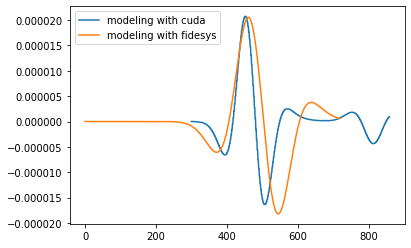

In [16]:
# это для 8352 узлов (valid_lemb_v6_Vy)
plt.plot([i+300 for i in range(new_x.shape[0])], -new_x/18.5, label='modeling with cuda')
window = 720
plt.plot([i for i in range(window)], filtered[:window], label='modeling with fidesys')
plt.legend()
plt.show()

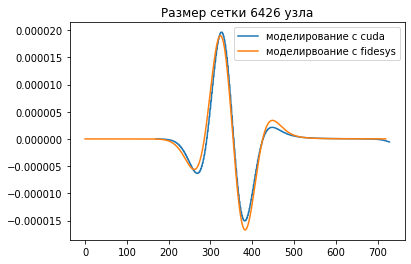

In [25]:
# это для 6426 узлов (valid_lemb_v5_Vy)
# plt.plot([i+180 for i in range(new_x.shape[0])], -new_x/12, label='modeling with cuda')
plt.plot([i+169 for i in range(new_x.shape[0])], -new_x/33, label='моделирование с cuda')
window = 720
plt.plot([i for i in range(window)], filtered[:window], label='моделирвоание с fidesys')
plt.title('Размер сетки 6426 узла')
plt.legend()
plt.show()

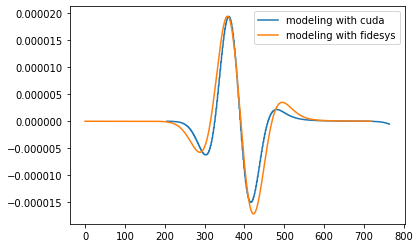

In [46]:
# это для 5040 узлов (valid_lemb_v4_Vy)
plt.plot([i+205 for i in range(new_x.shape[0])], -new_x/29, label='modeling with cuda')
window = 720
plt.plot([i for i in range(window)], filtered[:window], label='modeling with fidesys')
plt.legend()
plt.show()

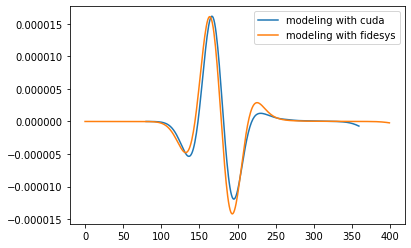

In [22]:
# это для 1071 (valid_lemb_v2)
window = 280
x = df.iloc[2*(26 - 1)+1, :][:window].values # для лемба
index = df.iloc[2*(27- 1), :][80:360].index
plt.plot(index, -x/100, label='modeling with cuda')

window = 400
plt.plot([i for i in range(window)], filtered[:window], label='modeling with fidesys')
plt.legend()
plt.show()

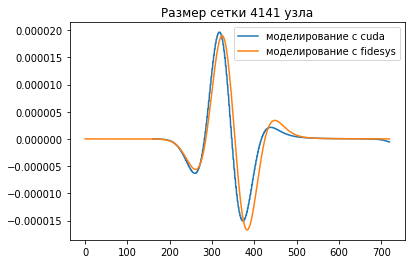

In [15]:
# это для 4141 узлов (valid_lemb_v1_Vy)
plt.plot([i+160 for i in range(new_x.shape[0])], -new_x/33, label='моделирование с cuda')
window = 720
plt.plot([i for i in range(window)], filtered[:window], label='моделирование с fidesys')
plt.title('Размер сетки 4141 узла')
plt.legend()
plt.show()

In [44]:
# график зависимости времени.
hs = [0.2, 0.17, 0.14, 0.11, 0.1, 0.095, 0.09, 0.083, 0.08, 0.075, 0.07]
nodes = [1071, 1500, 2160, 3404, 4141, 4558, 5040, 5929, 6426, 7236, 8352]
times_cuda = [3.5, 4.5, 9.1, 20.2, 25.3, 28.1, 30.4, 50, 52.2, 66.9, 75.7]
times_cpu = [78, 2*60+12, 3*60+7, 5*60+26, 8*60+4, 8*60+17, 8*60+50, 14*60+20, 15*60+33, 17*60+18, 22*60+22]

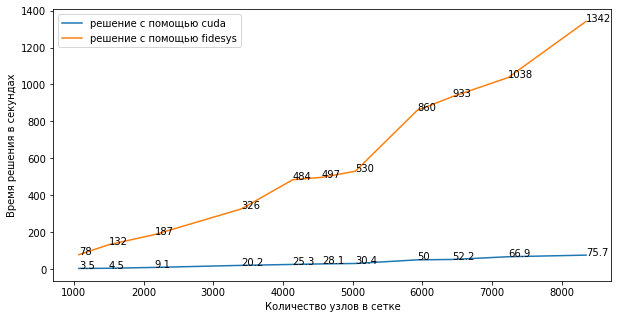

In [45]:
plt.figure(figsize=(10, 5))
plt.plot(nodes, times_cuda, label='решение с помощью cuda')
plt.plot(nodes, times_cpu, label='решение с помощью fidesys')

for i, text in enumerate(times_cuda):
    plt.annotate(text, (nodes[i], times_cuda[i]))
    plt.annotate(times_cpu[i], (nodes[i], times_cpu[i]))
    
plt.xlabel('Количество узлов в сетке')
plt.ylabel('Время решения в секундах')
plt.legend()
plt.show()

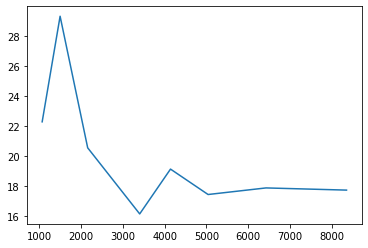

In [35]:
advantages = [times_cpu[i] / times_cuda[i] for i in range(len(nodes))]
plt.plot(nodes, advantages)

In [36]:
advantages

[22.285714285714285,
 29.333333333333332,
 20.54945054945055,
 16.13861386138614,
 19.130434782608695,
 17.43421052631579,
 17.873563218390803,
 17.72787318361955]

In [63]:
import numpy as np

A = 1
w = 30
t0 = -0.026

f = lambda t: A * (1 - 2 * (w * np.pi * (t - t0) - np.pi) ** 2) \
                * np.exp(-(np.pi * w * (t - t0) - np.pi) ** 2)


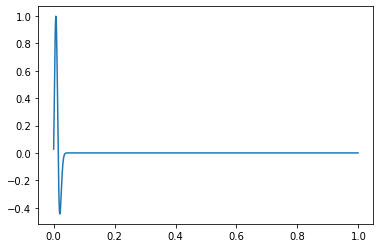

In [64]:
ts = [i * 0.001 for i in range(1000)]
arr = [f(t) for t in ts]

plt.plot(ts, arr)

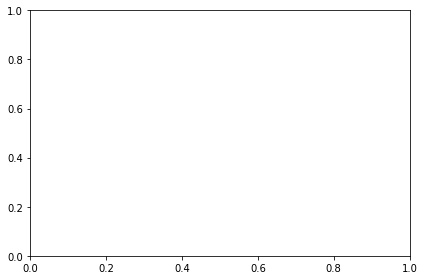

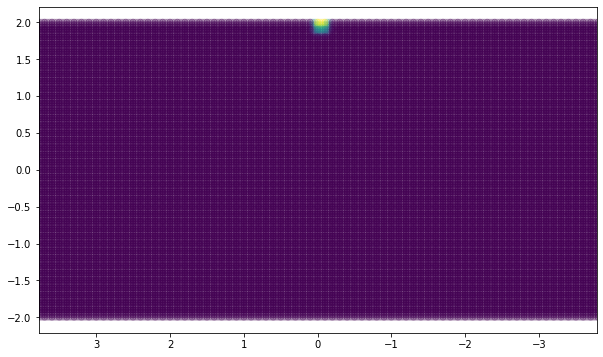

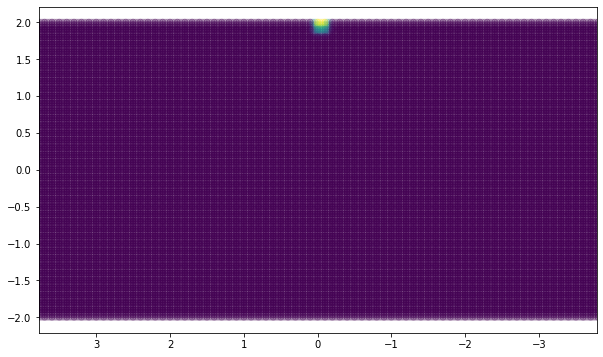

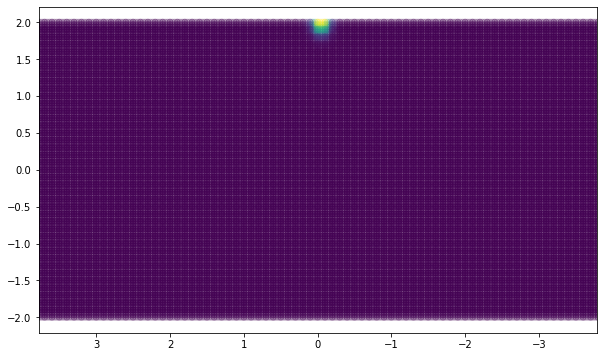

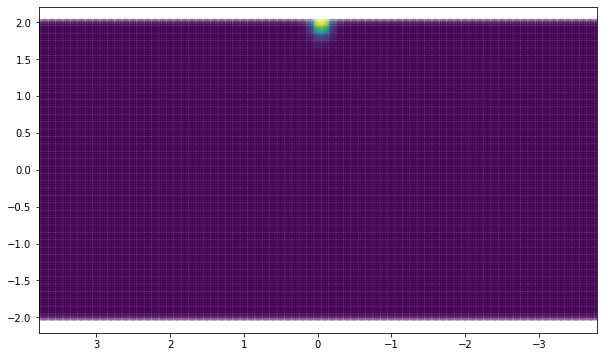

...

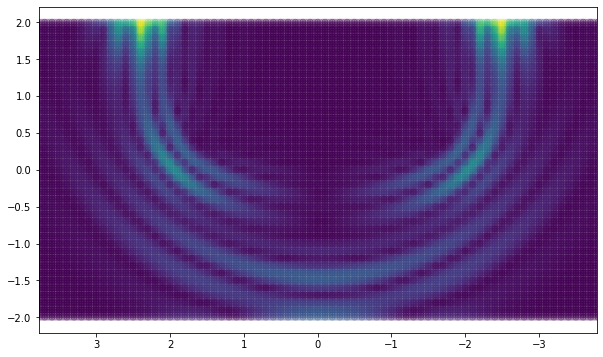

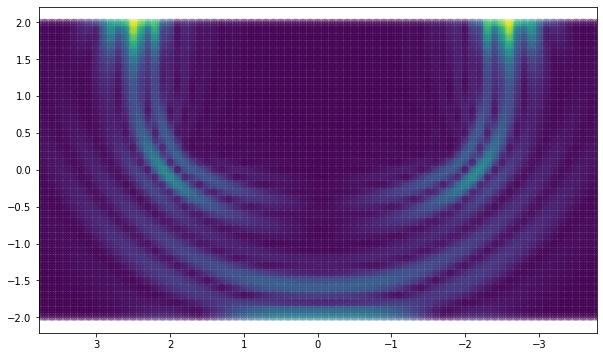

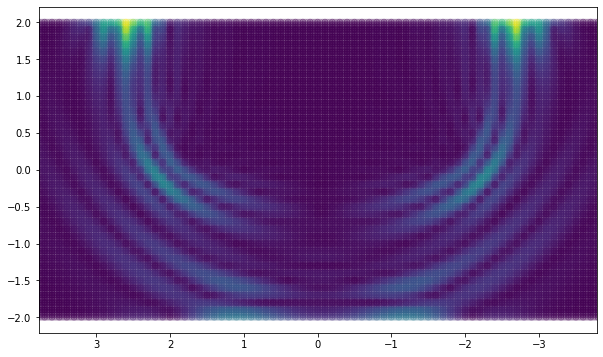

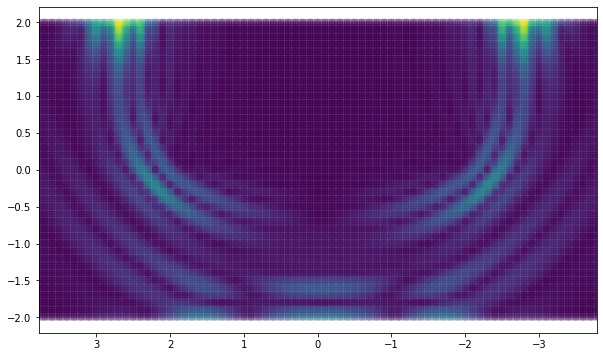

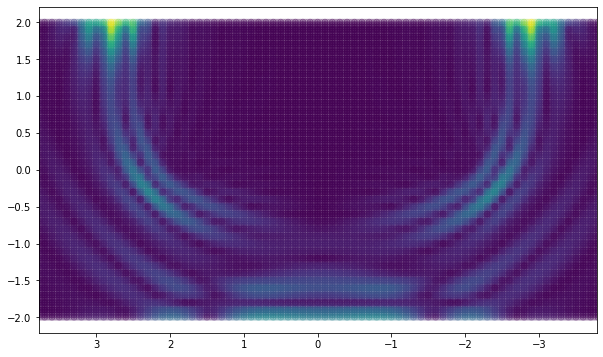

Animation loaded in animation_results/


In [4]:
save_animation(printer, NUM=4, name='lemb_wave_v1')

Эт всё для проверки работоспособности, вроде как, оно не нужно.

In [56]:


class PrinterResult:
    def __init__(df_elem, df_nodes, df, step=None, NUM=3):
        self.df_elem = df_elems
        self.df_nodes = df_nodes
        self.df = df
        self.step = step
        self.NUM = NUM

    def print_one(self, num, NUM=None, animation=False):
        # Это старая йункция, где я ещё записывал результат по
        # строчкам - узлы, а по столбцам - шаги етрации.
        # Сейчас я сохраняю наоборот, поэтому надо транспонировать.
        # num - видимо номер итерации.
        # NUM - число дополнительных узлов в картинке между узлами в сетке.
        # TODO: надо как-то ускорить, а то для большой сетки - долго.
        
        if not NUM:
            NUM = self.NUM

        for index in  df_elem.id:

            node1 = df_elem[df_elem.id == index].node1.values[0]
            node2 = df_elem[df_elem.id == index].node2.values[0]
            node3 = df_elem[df_elem.id == index].node3.values[0]
            node4 = df_elem[df_elem.id == index].node4.values[0]

            x1 = df_nodes[df_nodes.ind == node1].x.values[0]
            x2 = df_nodes[df_nodes.ind == node2].x.values[0]
            y1 = df_nodes[df_nodes.ind == node1].y.values[0]
            y2 = df_nodes[df_nodes.ind == node4].y.values[0]

            test_v = np.array([np.sqrt(df.loc[2*(node1-1), num]**2 + df.loc[2*(node1-1)+1, num]**2),
                               np.sqrt(df.loc[2*(node2-1), num]**2 + df.loc[2*(node2-1)+1, num]**2),
                               np.sqrt(df.loc[2*(node3-1), num]**2 + df.loc[2*(node3-1)+1, num]**2),
                               np.sqrt(df.loc[2*(node4-1), num]**2 + df.loc[2*(node4-1)+1, num]**2)])


            gridX = np.linspace(x2, x1, NUM)
            gridY = np.linspace(y2, y1, NUM)

            meshX, meshY = np.meshgrid(gridX, gridY)

            meshXY = np.dstack((meshX, meshY)).reshape(NUM**2, 2)

            predX = np.linspace(1,-1,NUM)
            predY = np.linspace(1,-1,NUM)
            predX, predY = np.meshgrid(predY, predX)
            predXY = np.dstack((predX, predY)).reshape(NUM**2, 2)
            predict = self.interpolate_test(predXY[:, 0], predXY[:, 1], test_v)

            try:
                pred = np.concatenate((pred, predict), axis=0)
                mesh = np.concatenate((mesh, meshXY), axis=0)
            except:
                pred = np.array(predict)
                mesh = np.array(meshXY)

        fig, ax = plt.subplots(figsize=(10,6))
        plt.scatter(mesh[:, 0], mesh[:, 1], c=pred, alpha=0.2)
        plt.axis('equal')
        plt.xlim(2.5, -2.5)
        plt.show()
        
        if animation is True:
            return mesh, pred
        
    def update(num, NUM=None):
        mesh, pred = print_one(num, NUM=NUM, animation=True)

        ax.scatter(mesh[:, 0], mesh[:, 1], c=pred, alpha=0.2)
        ax.axis('equal')

        return ax
    
    def interpolate_test(self, xi, eta, test_v):
        
        N1 = (1-xi) * (1-eta) / 4.0
        N2 = (1+xi) * (1-eta) / 4.0
        N3 = (1+xi) * (1+eta) / 4.0
        N4 = (1-xi) * (1+eta) / 4.0

        res = N1 * test_v[0] + N2 * test_v[1] \
            + N3 * test_v[2] + N4 * test_v[3]
        return res

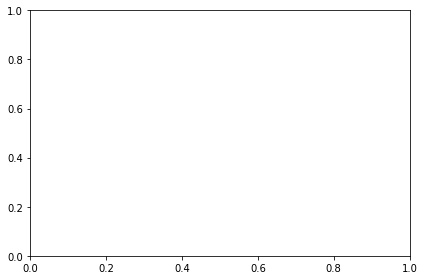

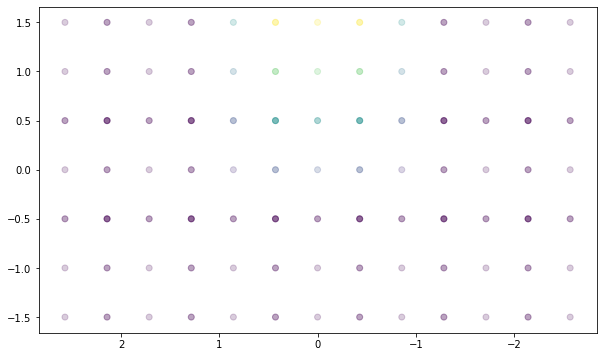

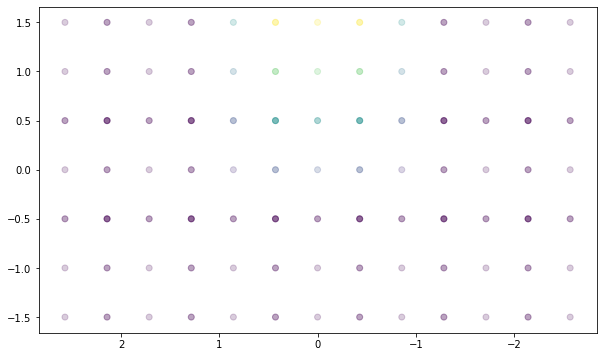

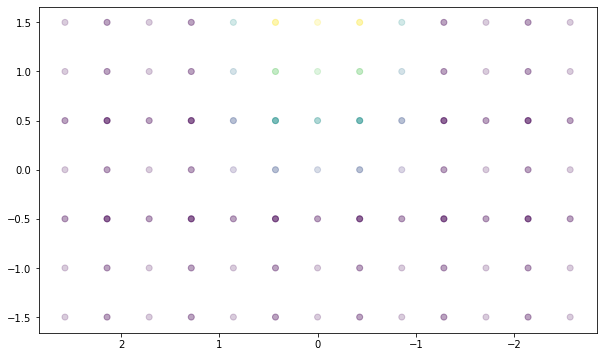

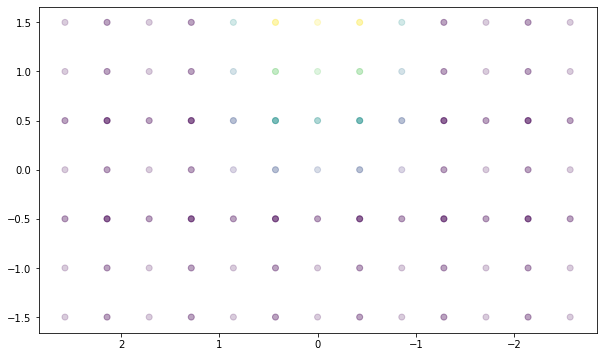

...

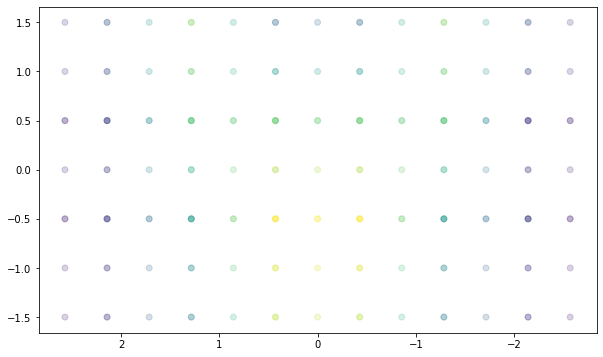

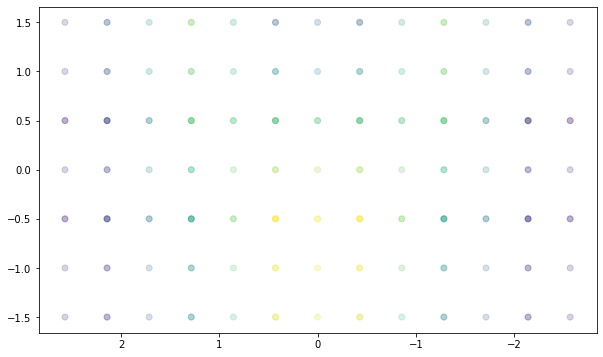

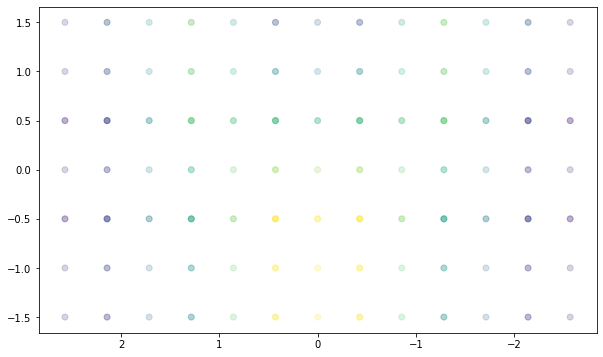

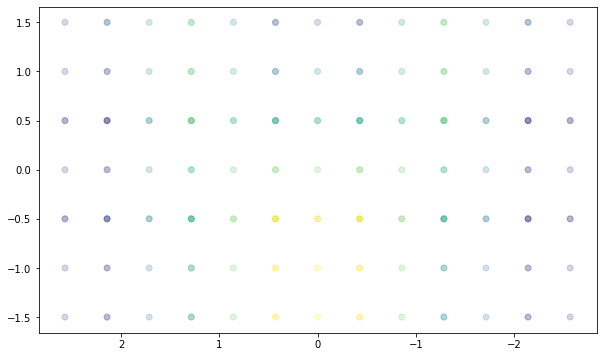

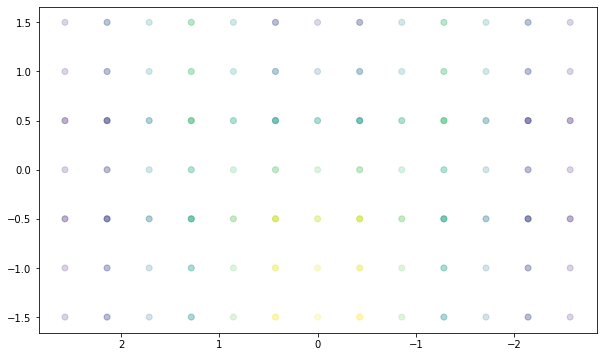

Animation loaded in animation_results/


In [59]:
def save_animation(printer, name="new_gif"):
    
    folder_dir = "animation_results/"
    full_dir = folder_dir + name

    fig, ax = plt.subplots()
    fig.set_tight_layout(True)

    def update(num):
        NUM = 3
        mesh, pred = printer.print_one(num, NUM=NUM, animation=True)

        ax.scatter(mesh[:, 0], mesh[:, 1], c=pred, alpha=0.2)
        ax.axis('equal')

        return ax

    anim = FuncAnimation(fig, update, frames=np.arange(2, 100, 2), interval=250)
    anim.save(full_dir + '.gif', dpi=80, writer='imagemagick')

    print("Animation loaded in {0}".format(folder_dir))
    
save_animation(printer)

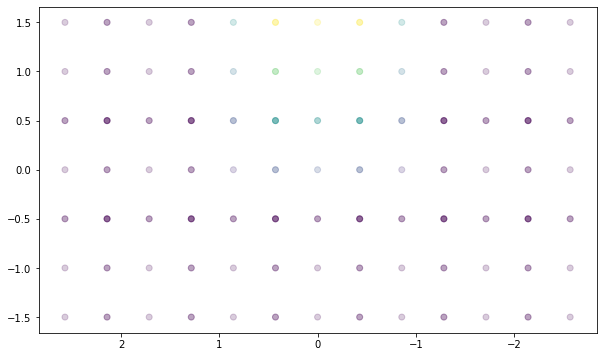

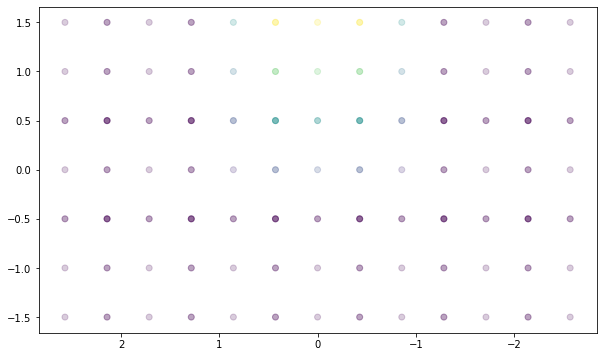

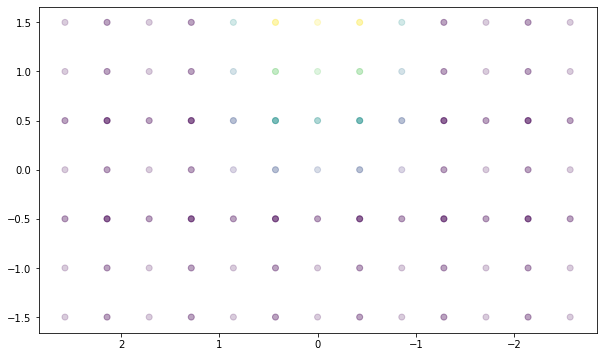

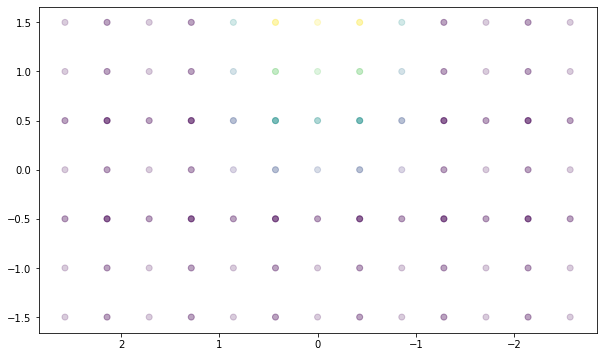

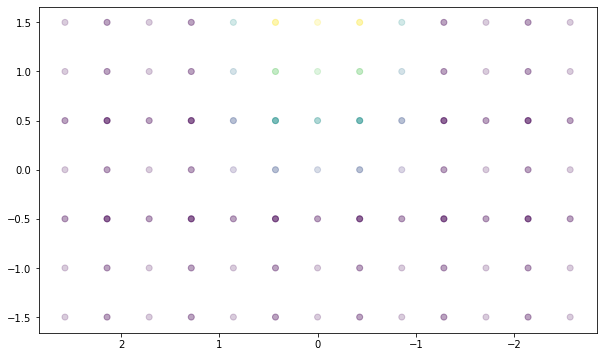

...

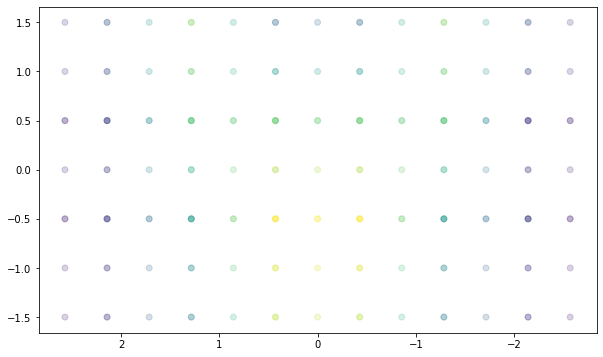

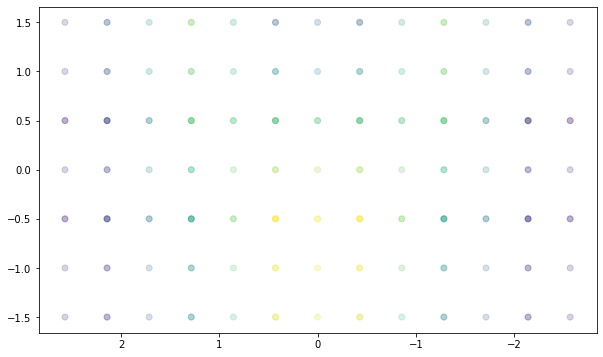

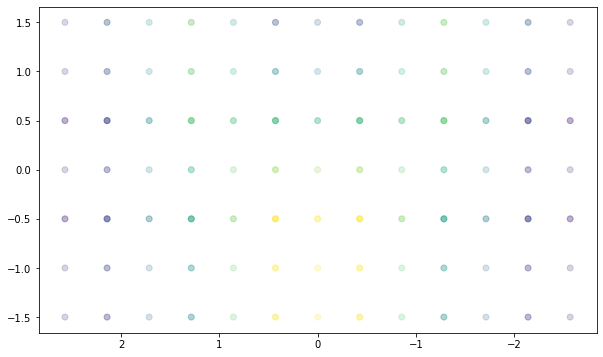

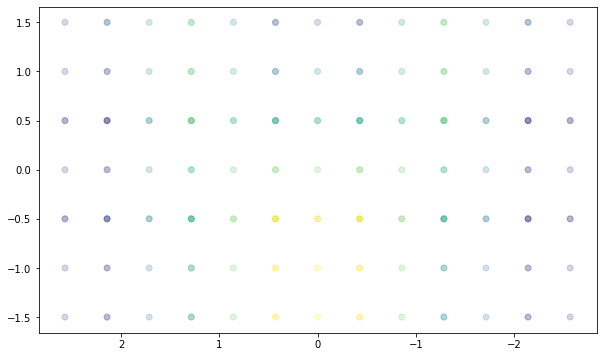

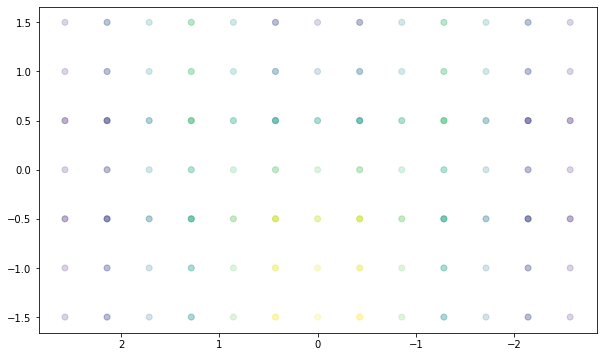

In [48]:
anim.save("animation_results/" + 'test.gif', dpi=80, writer='imagemagick')

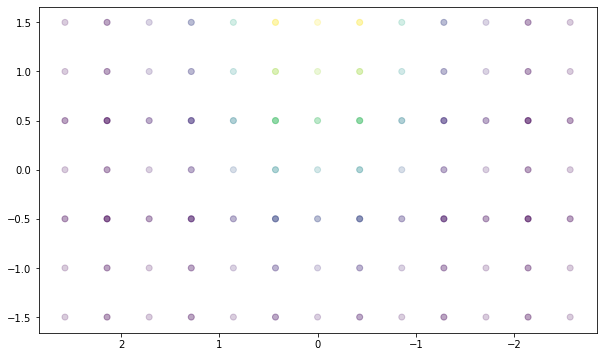

In [57]:
printer = PrinterResult(NUM=3)
printer.print_one(50)